In [189]:
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import pickle


import pycisTopic
import glob
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import multiprocess as mp
from multiprocess import Pool
import pprint as pp

%load_ext lab_black

The lab_black extension is already loaded. To reload it, use:
  %reload_ext lab_black


In [164]:
order = [
    "VIB_10xv1_1.FIXEDCELLS",
    "VIB_10xv1_2.FIXEDCELLS",
    "CNA_10xv11_1.FIXEDCELLS",
    "CNA_10xv11_2.FIXEDCELLS",
    "CNA_10xv11_3.FIXEDCELLS",
    "CNA_10xv11_4.FIXEDCELLS",
    "CNA_10xv11_5.FIXEDCELLS",
    "STA_10xv11_1.FIXEDCELLS",
    "STA_10xv11_2.FIXEDCELLS",
    "TXG_10xv11_1.FIXEDCELLS",
    "CNA_10xv2_1.FIXEDCELLS",
    "CNA_10xv2_2.FIXEDCELLS",
    "TXG_10xv2_1.FIXEDCELLS",
    "TXG_10xv2_2.FIXEDCELLS",
    "VIB_10xv2_1.FIXEDCELLS",
    "VIB_10xv2_2.FIXEDCELLS",
    "CNA_10xmultiome_1.FIXEDCELLS",
    "CNA_10xmultiome_2.FIXEDCELLS",
    "SAN_10xmultiome_1.FIXEDCELLS",
    "SAN_10xmultiome_2.FIXEDCELLS",
    "VIB_10xmultiome_1.FIXEDCELLS",
    "VIB_10xmultiome_2.FIXEDCELLS",
    "BRO_mtscatac_1.FIXEDCELLS",
    "BRO_mtscatac_2.FIXEDCELLS",
    "CNA_mtscatac_1.FIXEDCELLS",
    "CNA_mtscatac_2.FIXEDCELLS",
    "MDC_mtscatac_1.FIXEDCELLS",
    "MDC_mtscatac_2.FIXEDCELLS",
    "BIO_ddseq_1.FIXEDCELLS",
    "BIO_ddseq_2.FIXEDCELLS",
    "BIO_ddseq_3.FIXEDCELLS",
    "BIO_ddseq_4.FIXEDCELLS",
    "HAR_ddseq_1.FIXEDCELLS",
    "HAR_ddseq_2.FIXEDCELLS",
    "UCS_ddseq_1.FIXEDCELLS",
    "UCS_ddseq_2.FIXEDCELLS",
    "CNA_hydrop_1.FIXEDCELLS",
    "CNA_hydrop_2.FIXEDCELLS",
    "CNA_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_1.FIXEDCELLS",
    "EPF_hydrop_2.FIXEDCELLS",
    "EPF_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_4.FIXEDCELLS",
    "VIB_hydrop_1.FIXEDCELLS",
    "VIB_hydrop_2.FIXEDCELLS",
    "OHS_s3atac_1.FIXEDCELLS",
    "OHS_s3atac_2.FIXEDCELLS",
]

In [165]:
order_bytech = [
    ["VIB_10xv1_1.FIXEDCELLS", "VIB_10xv1_2.FIXEDCELLS"],
    [
        "CNA_10xv11_1.FIXEDCELLS",
        "CNA_10xv11_2.FIXEDCELLS",
        "CNA_10xv11_3.FIXEDCELLS",
        "CNA_10xv11_4.FIXEDCELLS",
        "CNA_10xv11_5.FIXEDCELLS",
        "STA_10xv11_1.FIXEDCELLS",
        "STA_10xv11_2.FIXEDCELLS",
        "TXG_10xv11_1.FIXEDCELLS",
    ],
    [
        "CNA_10xv2_1.FIXEDCELLS",
        "CNA_10xv2_2.FIXEDCELLS",
        "TXG_10xv2_1.FIXEDCELLS",
        "TXG_10xv2_2.FIXEDCELLS",
        "VIB_10xv2_1.FIXEDCELLS",
        "VIB_10xv2_2.FIXEDCELLS",
    ],
    [
        "CNA_10xmultiome_1.FIXEDCELLS",
        "CNA_10xmultiome_2.FIXEDCELLS",
        "SAN_10xmultiome_1.FIXEDCELLS",
        "SAN_10xmultiome_2.FIXEDCELLS",
        "VIB_10xmultiome_1.FIXEDCELLS",
        "VIB_10xmultiome_2.FIXEDCELLS",
    ],
    [
        "BRO_mtscatac_1.FIXEDCELLS",
        "BRO_mtscatac_2.FIXEDCELLS",
        "CNA_mtscatac_1.FIXEDCELLS",
        "CNA_mtscatac_2.FIXEDCELLS",
        "MDC_mtscatac_1.FIXEDCELLS",
        "MDC_mtscatac_2.FIXEDCELLS",
    ],
    [
        "BIO_ddseq_1.FIXEDCELLS",
        "BIO_ddseq_2.FIXEDCELLS",
        "BIO_ddseq_3.FIXEDCELLS",
        "BIO_ddseq_4.FIXEDCELLS",
        "HAR_ddseq_1.FIXEDCELLS",
        "HAR_ddseq_2.FIXEDCELLS",
        "UCS_ddseq_1.FIXEDCELLS",
        "UCS_ddseq_2.FIXEDCELLS",
    ],
    [
        "CNA_hydrop_1.FIXEDCELLS",
        "CNA_hydrop_2.FIXEDCELLS",
        "CNA_hydrop_3.FIXEDCELLS",
        "EPF_hydrop_1.FIXEDCELLS",
        "EPF_hydrop_2.FIXEDCELLS",
        "EPF_hydrop_3.FIXEDCELLS",
        "EPF_hydrop_4.FIXEDCELLS",
        "VIB_hydrop_1.FIXEDCELLS",
        "VIB_hydrop_2.FIXEDCELLS",
    ],
    ["OHS_s3atac_1.FIXEDCELLS", "OHS_s3atac_2.FIXEDCELLS"],
]

In [166]:
order_bytech_bycentre = [
    [["VIB_10xv1_1.FIXEDCELLS", "VIB_10xv1_2.FIXEDCELLS"]],
    [
        [
            "CNA_10xv11_1.FIXEDCELLS",
            "CNA_10xv11_2.FIXEDCELLS",
            "CNA_10xv11_3.FIXEDCELLS",
            "CNA_10xv11_4.FIXEDCELLS",
            "CNA_10xv11_5.FIXEDCELLS",
        ],
        [
            "STA_10xv11_1.FIXEDCELLS",
            "STA_10xv11_2.FIXEDCELLS",
        ],
        [
            "TXG_10xv11_1.FIXEDCELLS",
        ],
    ],
    [
        [
            "CNA_10xv2_1.FIXEDCELLS",
            "CNA_10xv2_2.FIXEDCELLS",
        ],
        [
            "TXG_10xv2_1.FIXEDCELLS",
            "TXG_10xv2_2.FIXEDCELLS",
        ],
        [
            "VIB_10xv2_1.FIXEDCELLS",
            "VIB_10xv2_2.FIXEDCELLS",
        ],
    ],
    [
        [
            "CNA_10xmultiome_1.FIXEDCELLS",
            "CNA_10xmultiome_2.FIXEDCELLS",
        ],
        [
            "SAN_10xmultiome_1.FIXEDCELLS",
            "SAN_10xmultiome_2.FIXEDCELLS",
        ],
        [
            "VIB_10xmultiome_1.FIXEDCELLS",
            "VIB_10xmultiome_2.FIXEDCELLS",
        ],
    ],
    [
        [
            "BRO_mtscatac_1.FIXEDCELLS",
            "BRO_mtscatac_2.FIXEDCELLS",
        ],
        [
            "CNA_mtscatac_1.FIXEDCELLS",
            "CNA_mtscatac_2.FIXEDCELLS",
        ],
        [
            "MDC_mtscatac_1.FIXEDCELLS",
            "MDC_mtscatac_2.FIXEDCELLS",
        ],
    ],
    [
        [
            "BIO_ddseq_1.FIXEDCELLS",
            "BIO_ddseq_2.FIXEDCELLS",
            "BIO_ddseq_3.FIXEDCELLS",
            "BIO_ddseq_4.FIXEDCELLS",
        ],
        [
            "HAR_ddseq_1.FIXEDCELLS",
            "HAR_ddseq_2.FIXEDCELLS",
        ],
        [
            "UCS_ddseq_1.FIXEDCELLS",
            "UCS_ddseq_2.FIXEDCELLS",
        ],
    ],
    [
        [
            "CNA_hydrop_1.FIXEDCELLS",
            "CNA_hydrop_2.FIXEDCELLS",
            "CNA_hydrop_3.FIXEDCELLS",
        ],
        [
            "EPF_hydrop_1.FIXEDCELLS",
            "EPF_hydrop_2.FIXEDCELLS",
            "EPF_hydrop_3.FIXEDCELLS",
            "EPF_hydrop_4.FIXEDCELLS",
        ],
        [
            "VIB_hydrop_1.FIXEDCELLS",
            "VIB_hydrop_2.FIXEDCELLS",
        ],
    ],
    [["OHS_s3atac_1.FIXEDCELLS", "OHS_s3atac_2.FIXEDCELLS"]],
]

In [167]:
!cat ../0_resources/scripts/qc_plots_pub.py

import kde
import pycisTopic
import glob
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import multiprocess as mp
from multiprocess import Pool
import pprint as pp


def histogram(array, nbins=100):
    """
    Draw histogram from distribution and identify centers.
    Parameters
    ---------
    array: `class::np.array`
            Scores distribution
    nbins: int
            Number of bins to use in the histogram
    Return
    ---------
    float
            Histogram values and bin centers.
    """
    array = array.ravel().flatten()
    hist, bin_edges = np.histogram(array, bins=nbins, range=None)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.0
    return hist, bin_centers


def threshold_otsu(array, nbins=100, min_value=100):
    """
    Apply Otsu threshold on topic-region distributions [Otsu, 1979].
    Parameters
    ---------
    array: `class::np.array`
            Array containing the region v

In [168]:
metadata_bc_pkl_path_dict = {
    x.split("/")[-1].split("__")[0]: x
    for x in sorted(glob.glob("40k/cistopic_qc_out_CONSENSUS/*metadata_bc.pkl"))
}
for key in [
    "VIB_hydrop_11.FIXEDCELLS",
    "VIB_hydrop_12.FIXEDCELLS",
    "VIB_hydrop_21.FIXEDCELLS",
    "VIB_hydrop_22.FIXEDCELLS",
]:
    metadata_bc_pkl_path_dict.pop(key)

metadata_bc_pkl_path_dict

{'BIO_ddseq_1.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/BIO_ddseq_1.FIXEDCELLS__metadata_bc.pkl',
 'BIO_ddseq_2.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/BIO_ddseq_2.FIXEDCELLS__metadata_bc.pkl',
 'BIO_ddseq_3.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/BIO_ddseq_3.FIXEDCELLS__metadata_bc.pkl',
 'BIO_ddseq_4.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/BIO_ddseq_4.FIXEDCELLS__metadata_bc.pkl',
 'BRO_mtscatac_1.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/BRO_mtscatac_1.FIXEDCELLS__metadata_bc.pkl',
 'BRO_mtscatac_2.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/BRO_mtscatac_2.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xmultiome_1.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/CNA_10xmultiome_1.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xmultiome_2.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/CNA_10xmultiome_2.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xv11_1.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/CNA_10xv11_1.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xv11_2.FIXEDCELLS': '40k/cistopic_qc_out_CONSENSUS/CNA

In [169]:
selected_bc_path_dict = {
    x.split("/")[-1].split(".")[0]: x
    for x in sorted(glob.glob("selected_barcodes/*_bc_passing_filters_otsu.pkl"))
}
selected_bc_path_dict

{'BIO_ddseq_1': 'selected_barcodes/BIO_ddseq_1.FULL_bc_passing_filters_otsu.pkl',
 'BIO_ddseq_2': 'selected_barcodes/BIO_ddseq_2.FULL_bc_passing_filters_otsu.pkl',
 'BIO_ddseq_3': 'selected_barcodes/BIO_ddseq_3.FULL_bc_passing_filters_otsu.pkl',
 'BIO_ddseq_4': 'selected_barcodes/BIO_ddseq_4.FULL_bc_passing_filters_otsu.pkl',
 'BRO_mtscatac_1': 'selected_barcodes/BRO_mtscatac_1.FULL_bc_passing_filters_otsu.pkl',
 'BRO_mtscatac_2': 'selected_barcodes/BRO_mtscatac_2.FULL_bc_passing_filters_otsu.pkl',
 'CNA_10xmultiome_1': 'selected_barcodes/CNA_10xmultiome_1.FULL_bc_passing_filters_otsu.pkl',
 'CNA_10xmultiome_2': 'selected_barcodes/CNA_10xmultiome_2.FULL_bc_passing_filters_otsu.pkl',
 'CNA_10xv11_1': 'selected_barcodes/CNA_10xv11_1.FULL_bc_passing_filters_otsu.pkl',
 'CNA_10xv11_2': 'selected_barcodes/CNA_10xv11_2.FULL_bc_passing_filters_otsu.pkl',
 'CNA_10xv11_3': 'selected_barcodes/CNA_10xv11_3.FULL_bc_passing_filters_otsu.pkl',
 'CNA_10xv11_4': 'selected_barcodes/CNA_10xv11_4.FULL_bc

In [170]:
# calculate global maxima to make nice equal plots:
metadata_bc_df_all = pd.DataFrame()
for sample in metadata_bc_pkl_path_dict.keys():
    with open(metadata_bc_pkl_path_dict[sample], "rb") as fh:
        metadata_bc_df = pickle.load(fh)
        metadata_bc_df_all = pd.concat([metadata_bc_df_all, metadata_bc_df])
        print(f"added {sample} metadata_bc_df")

max_dict = {}
min_dict = {}
for stat in metadata_bc_df_all.columns:
    max_dict[stat] = metadata_bc_df_all[stat].max()
    min_dict[stat] = metadata_bc_df_all[stat].min()

pp.pprint(min_dict)
pp.pprint(max_dict)

standard_min_x_val = 100
standard_min_y_val = 1
min_otsu_frags_dict = {}
min_otsu_tss_dict = {}

for metadata_bc_pkl_path in sorted(metadata_bc_pkl_path_dict.keys()):
    sample = metadata_bc_pkl_path.split("/")[-1].split("__metadata_bc.pkl")[0]
    tech = sample.split("_")[1]
    if tech == "ddseq":
        if "BIO_ddseq_1.FULL" in sample:
            min_otsu_frags_dict[sample] = 600
        else:
            min_otsu_frags_dict[sample] = 300
    elif tech == "hydrop":
        min_otsu_frags_dict[sample] = 300
    else:
        min_otsu_frags_dict[sample] = standard_min_x_val

    if tech == "s3atac":
        min_otsu_tss_dict[sample] = 0
    else:
        min_otsu_tss_dict[sample] = standard_min_y_val

added BIO_ddseq_1.FIXEDCELLS metadata_bc_df
added BIO_ddseq_2.FIXEDCELLS metadata_bc_df
added BIO_ddseq_3.FIXEDCELLS metadata_bc_df
added BIO_ddseq_4.FIXEDCELLS metadata_bc_df
added BRO_mtscatac_1.FIXEDCELLS metadata_bc_df
added BRO_mtscatac_2.FIXEDCELLS metadata_bc_df
added CNA_10xmultiome_1.FIXEDCELLS metadata_bc_df
added CNA_10xmultiome_2.FIXEDCELLS metadata_bc_df
added CNA_10xv11_1.FIXEDCELLS metadata_bc_df
added CNA_10xv11_2.FIXEDCELLS metadata_bc_df
added CNA_10xv11_3.FIXEDCELLS metadata_bc_df
added CNA_10xv11_4.FIXEDCELLS metadata_bc_df
added CNA_10xv11_5.FIXEDCELLS metadata_bc_df
added CNA_10xv2_1.FIXEDCELLS metadata_bc_df
added CNA_10xv2_2.FIXEDCELLS metadata_bc_df
added CNA_hydrop_1.FIXEDCELLS metadata_bc_df
added CNA_hydrop_2.FIXEDCELLS metadata_bc_df
added CNA_hydrop_3.FIXEDCELLS metadata_bc_df
added CNA_mtscatac_1.FIXEDCELLS metadata_bc_df
added CNA_mtscatac_2.FIXEDCELLS metadata_bc_df
added EPF_hydrop_1.FIXEDCELLS metadata_bc_df
added EPF_hydrop_2.FIXEDCELLS metadata_bc_d

In [171]:
metadata_bc_pkl_path_dict = {
    x.split("/")[-1].split("__")[0]: x
    for x in sorted(glob.glob("40k/cistopic_qc_out/*metadata_bc.pkl"))
}
for key in [
    "VIB_hydrop_11.FIXEDCELLS",
    "VIB_hydrop_12.FIXEDCELLS",
    "VIB_hydrop_21.FIXEDCELLS",
    "VIB_hydrop_22.FIXEDCELLS",
]:
    metadata_bc_pkl_path_dict.pop(key)

metadata_bc_pkl_path_dict

{'BIO_ddseq_1.FIXEDCELLS': '40k/cistopic_qc_out/BIO_ddseq_1.FIXEDCELLS__metadata_bc.pkl',
 'BIO_ddseq_2.FIXEDCELLS': '40k/cistopic_qc_out/BIO_ddseq_2.FIXEDCELLS__metadata_bc.pkl',
 'BIO_ddseq_3.FIXEDCELLS': '40k/cistopic_qc_out/BIO_ddseq_3.FIXEDCELLS__metadata_bc.pkl',
 'BIO_ddseq_4.FIXEDCELLS': '40k/cistopic_qc_out/BIO_ddseq_4.FIXEDCELLS__metadata_bc.pkl',
 'BRO_mtscatac_1.FIXEDCELLS': '40k/cistopic_qc_out/BRO_mtscatac_1.FIXEDCELLS__metadata_bc.pkl',
 'BRO_mtscatac_2.FIXEDCELLS': '40k/cistopic_qc_out/BRO_mtscatac_2.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xmultiome_1.FIXEDCELLS': '40k/cistopic_qc_out/CNA_10xmultiome_1.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xmultiome_2.FIXEDCELLS': '40k/cistopic_qc_out/CNA_10xmultiome_2.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xv11_1.FIXEDCELLS': '40k/cistopic_qc_out/CNA_10xv11_1.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xv11_2.FIXEDCELLS': '40k/cistopic_qc_out/CNA_10xv11_2.FIXEDCELLS__metadata_bc.pkl',
 'CNA_10xv11_3.FIXEDCELLS': '40k/cistopic_qc_out/CNA_10xv11_

In [172]:
# import kde
import pycisTopic
import glob
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import multiprocess as mp
from multiprocess import Pool
import pprint as pp


def histogram(array, nbins=100):
    """
    Draw histogram from distribution and identify centers.
    Parameters
    ---------
    array: `class::np.array`
            Scores distribution
    nbins: int
            Number of bins to use in the histogram
    Return
    ---------
    float
            Histogram values and bin centers.
    """
    array = array.ravel().flatten()
    hist, bin_edges = np.histogram(array, bins=nbins, range=None)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.0
    return hist, bin_centers


def threshold_otsu(array, nbins=100, min_value=100):
    """
    Apply Otsu threshold on topic-region distributions [Otsu, 1979].
    Parameters
    ---------
    array: `class::np.array`
            Array containing the region values for the topic to be binarized.
    nbins: int
            Number of bins to use in the binarization histogram
    Return
    ---------
    float
            Binarization threshold.
    Reference
    ---------
    Otsu, N., 1979. A threshold selection method from gray-level histograms. IEEE transactions on systems, man, and
    cybernetics, 9(1), pp.62-66.
    """
    array = array[(array >= min_value)]
    hist, bin_centers = histogram(array, nbins)
    hist = hist.astype(float)
    # Class probabilities for all possible thresholds
    weight1 = np.cumsum(hist)
    weight2 = np.cumsum(hist[::-1])[::-1]
    # Class means for all possible thresholds
    mean1 = np.cumsum(hist * bin_centers) / weight1
    mean2 = (np.cumsum((hist * bin_centers)[::-1]) / weight2[::-1])[::-1]
    # Clip ends to align class 1 and class 2 variables:
    # The last value of ``weight1``/``mean1`` should pair with zero values in
    # ``weight2``/``mean2``, which do not exist.
    variance12 = weight1[:-1] * weight2[1:] * (mean1[:-1] - mean2[1:]) ** 2
    idx = np.argmax(variance12)
    threshold = bin_centers[:-1][idx]
    return threshold


def plot_qc(
    x,
    y,
    ax,
    z=None,
    x_thr_min=None,
    x_thr_max=None,
    y_thr_min=None,
    y_thr_max=None,
    ylab=None,
    xlab="Number of (unique) fragments",
    cmap="viridis",
    density_overlay=False,
    s=10,
    marker="+",
    c="#343434",
    xlim=None,
    ylim=None,
    **kwargs
):
    assert all(x.index == y.index)
    barcodes = x.index.values

    if density_overlay:
        cores = 8

        x_log = np.log(x)

        # Split input array for KDE [log(x), y] array in
        # equaly spaced parts (start_offset + n * nbr_cores).
        kde_parts = [np.vstack([x_log[i::cores], y[i::cores]]) for i in range(cores)]

        # Get nultiprocess context object to spawn processes.
        # mp_ctx = mp.get_context("spawn")

        # Calculate KDE in parallel.
        with Pool(processes=cores) as pool:
            results = pool.map(kde.calc_kde, kde_parts)

        z = np.concatenate(results)

        # now order x and y in the same way that z was ordered, otherwise random z value is assigned to barcode:
        x_ordered = np.concatenate([x[i::cores] for i in range(cores)])
        y_ordered = np.concatenate([y[i::cores] for i in range(cores)])

        idx = (
            z.argsort()
        )  # order based on z value so that highest value is plotted on top, and not hidden by lower values
        x, y, z, barcodes = x_ordered[idx], y_ordered[idx], z[idx], barcodes[idx]
    elif z == None:
        if c != None:
            z = c

    sp = ax.scatter(x, y, c=z, s=s, edgecolors=None, marker=marker, cmap=cmap, **kwargs)
    if ylim is not None:
        ax.set_ylim(ylim[0], ylim[1])
    if xlim is not None:
        ax.set_xlim(xlim[0], xlim[1])

    # Start with keeping all barcodes.
    barcodes_to_keep = np.full(x.shape[0], True)

    # Filter barcodes out if needed based on thresholds:
    if x_thr_min is not None:
        ax.axvline(x=x_thr_min, color="r", linestyle="--")

    if x_thr_max is not None:
        ax.axvline(x=x_thr_max, color="r", linestyle="--")

    if y_thr_min is not None:
        ax.axhline(y=y_thr_min, color="r", linestyle="--")

    if y_thr_max is not None:
        ax.axhline(y=y_thr_max, color="r", linestyle="--")

    ax.set_xscale("log")
    ax.set_xmargin(0.01)
    ax.set_ymargin(0.01)
    ax.set_xlabel(xlab, fontsize=10)
    ax.set_ylabel(ylab, fontsize=10)

In [173]:
max_dict

{'Log_total_nr_frag': 6.645620309635535,
 'Log_unique_nr_frag': 6.401761957745522,
 'Total_nr_frag': 4422016,
 'Unique_nr_frag': 2522098,
 'Dupl_nr_frag': 1899918,
 'Dupl_rate': 0.9832010145405903,
 'Total_nr_frag_in_regions': 351191,
 'Unique_nr_frag_in_regions': 246018,
 'FRIP': 1.0,
 'TSS_enrichment': 97.13123876876705,
 'sample_id': 'VIB_hydrop_2.FIXEDCELLS'}

# by sample

In [176]:
tech_alias_dict = {
    "10xmultiome": "10x Multiome",
    "10xv1": "10x v1",
    "10xv11": "10x v1.1",
    "10xv2": "10x v2",
    "ddseq": "BioRad ddSeq",
    "hydrop": "HyDrop",
    "mtscatac": "mtscATAC-seq",
    "s3atac": "s3-ATAC",
}

In [177]:
centre_alias_dict = {
    "BIO": "BioRad",
    "BRO": "Broad Institute",
    "CNA": "CNAG",
    "EPF": "EPFL",
    "HAR": "Harvard",
    "MDC": "Max Delbrück Centre",
    "OHS": "Oregon HSU",
    "SAN": "Sanger Institute",
    "STA": "Stanford",
    "TXG": "10x Genomics",
    "UCS": "UC San Francisco",
    "VIB": "VIB",
}

# Indidivual samples

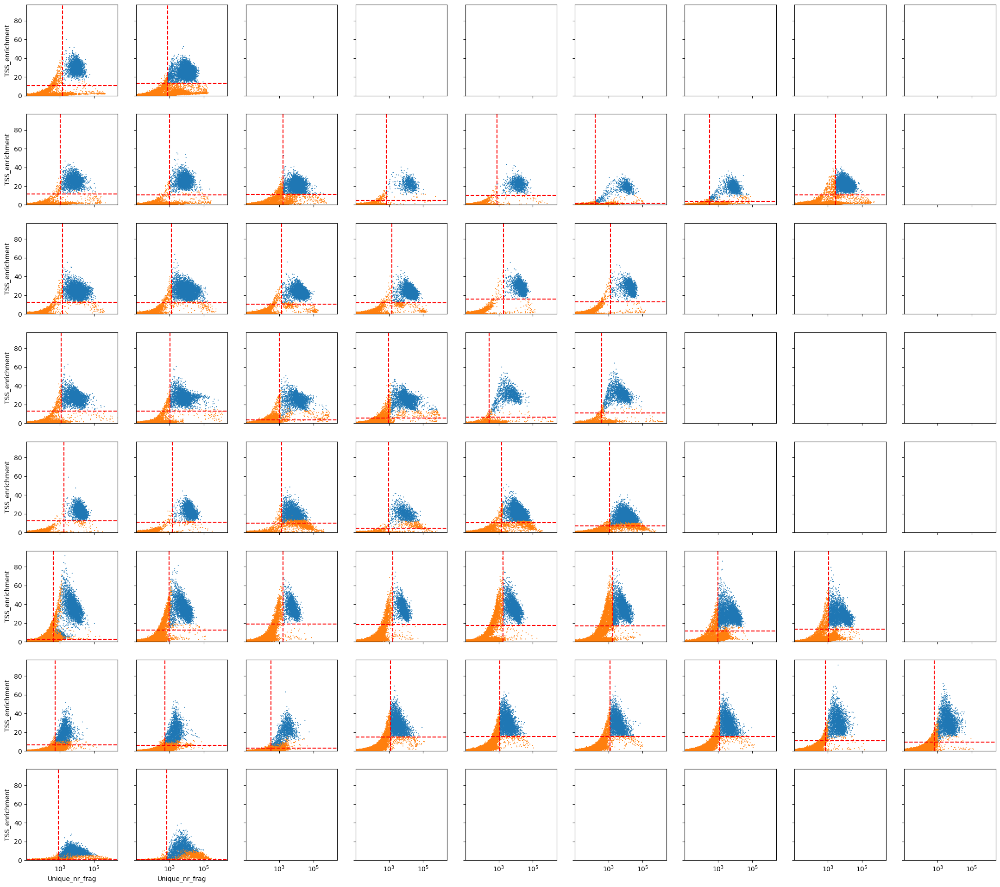

In [161]:
n_techs = len(order_bytech)
max_samples_in_tech = max([len(x) for x in order_bytech])

fig, axes = plt.subplots(n_techs, max_samples_in_tech, sharex=True, sharey=True)
fig.set_figheight(3 * n_techs)
fig.set_figwidth(3 * max_samples_in_tech)

is_cell_color_palette_sample = {
    sample: list(sns.color_palette(n_colors=2))[["is_cell", "is_noise"].index(sample)]
    for sample in ["is_cell", "is_noise"]
}


for tech_set in order_bytech:
    tech_set_index = order_bytech.index(tech_set)
    for sample in tech_set:
        sample_index = tech_set.index(sample)
        supersample = sample.split(".")[0]
        ax = axes[tech_set_index, sample_index]

        with open(metadata_bc_pkl_path_dict[sample], "rb") as fh:
            metadata_bc_df = pickle.load(fh)

        metadata_bc_df["supersample"] = [
            x.split(".")[0] for x in metadata_bc_df["sample_id"]
        ]
        metadata_bc_df["raw_barcode"] = [
            x.split("___")[0] for x in metadata_bc_df.index
        ]

        with open(selected_bc_path_dict[supersample], "rb") as fh:
            bc_passing_filters = pickle.load(fh)

        bc_passing_filters_raw = [x.split("___")[0] for x in bc_passing_filters]

        metadata_bc_df["is_cell"] = (
            metadata_bc_df["raw_barcode"]
            .isin(bc_passing_filters_raw)
            .replace(to_replace=True, value="is_cell")
            .replace(to_replace=False, value="is_noise")
        )

        ### Plot 1
        x_stat = "Unique_nr_frag"
        y_stat = "TSS_enrichment"
        z_stat = "is_cell"
        x_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[x_stat]
        y_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[y_stat]

        sns.scatterplot(
            data=metadata_bc_df,
            x=x_stat,
            y=y_stat,
            hue=z_stat,
            palette=is_cell_color_palette_sample,
            ax=ax,
            s=2,
            linewidth=0,
            legend=False,
        )
        ax.set_xscale("log")
        ax.set_xlim(min_dict[x_stat], max_dict[x_stat])
        ax.set_ylim(min_dict[y_stat], max_dict[y_stat])

        ax.axvline(x=x_cutoff, color="r", linestyle="--")
        ax.axhline(y=y_cutoff, color="r", linestyle="--")

plt.savefig("plts/TSS_enrichment__Unique_nr_frag__ALL.png", facecolor="white", dpi=300)
plt.show()
plt.close()

# UMAP

In [196]:
cto_path_dict = {
    x.split("/")[-1].split("__")[0]: x
    for x in glob.glob(
        "../fixedcells_3_cistopic_consensus/cistopic_objects/*consensus.pkl"
    )
}

In [213]:
with open(cto_path_dict["TXG_10xv2_1.FIXEDCELLS"], "rb") as fh:
    cto = pickle.load(fh)

In [222]:
to_palette = list(cto.cell_data["consensus_cell_type"].unique())
cell_palette = {
    cell_type: list(
        sns.color_palette(n_colors=len(to_palette))[to_palette.index(cell_type)]
    )
    for cell_type in to_palette
}

In [223]:
cell_palette

{'CD14+ monocyte': [0.12156862745098039,
  0.4666666666666667,
  0.7058823529411765],
 'CD4+ T cell': [1.0, 0.4980392156862745, 0.054901960784313725],
 'Dendritic cell': [0.17254901960784313,
  0.6274509803921569,
  0.17254901960784313],
 'Cytotoxic T cell': [0.8392156862745098,
  0.15294117647058825,
  0.1568627450980392],
 'CD16+ monocyte': [0.5803921568627451, 0.403921568627451, 0.7411764705882353],
 'Natural killer cell': [0.5490196078431373,
  0.33725490196078434,
  0.29411764705882354],
 'B cell': [0.8901960784313725, 0.4666666666666667, 0.7607843137254902]}

In [229]:
supersample

'OHS_s3atac_2'

10xv1
10xv11
10xv2
10xmultiome
mtscatac
ddseq
hydrop
s3atac


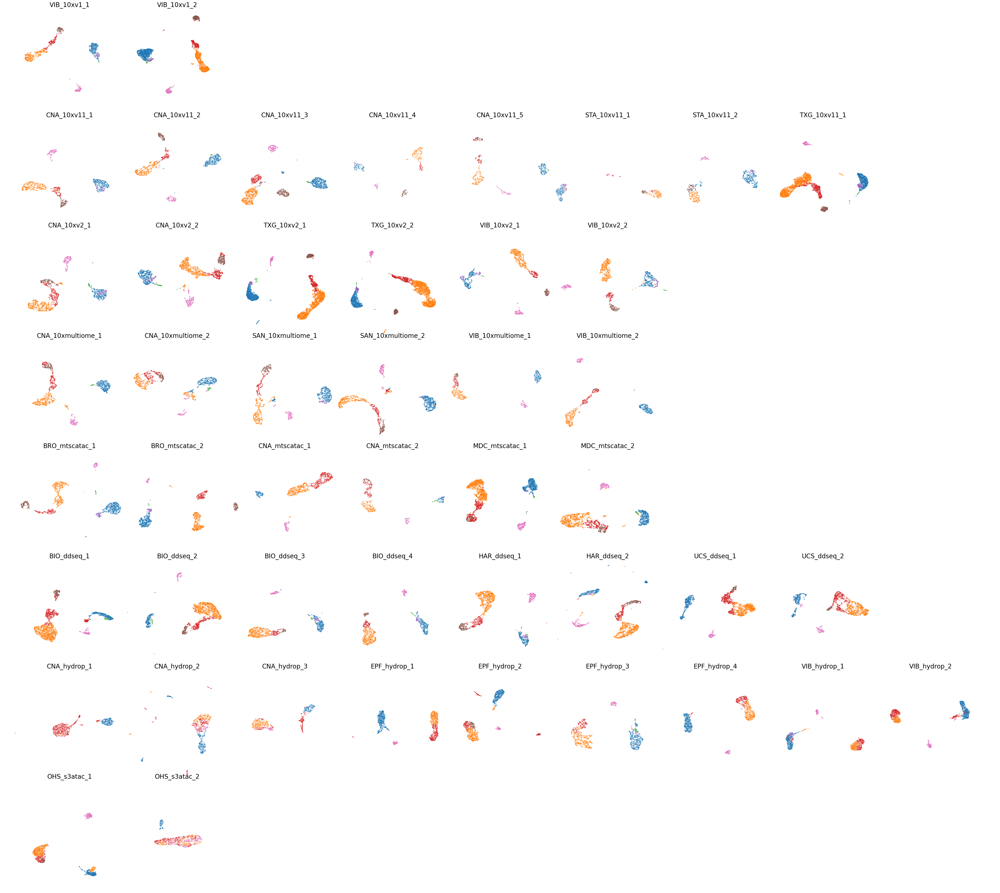

In [235]:
n_techs = len(order_bytech)
max_samples_in_tech = max([len(x) for x in order_bytech])

fig, axes = plt.subplots(n_techs, max_samples_in_tech, sharex=True, sharey=True)
fig.set_figheight(5 * n_techs)
fig.set_figwidth(5 * max_samples_in_tech)


for tech_set in order_bytech:
    tech = tech_set[0].split("_")[1]
    print(tech)

    tech_set_index = order_bytech.index(tech_set)

    for sample in tech_set:
        sample_index = tech_set.index(sample)
        supersample = sample.split(".")[0]

        ax = axes[tech_set_index, sample_index]

        with open(cto_path_dict[sample], "rb") as fh:
            cto = pickle.load(fh)

        ### Plot 1
        cto.cell_data["UMAP_1"] = cto.projections["cell"]["UMAP"]["UMAP_1"]
        cto.cell_data["UMAP_2"] = cto.projections["cell"]["UMAP"]["UMAP_2"]
        toplot_df = cto.cell_data

        sns.scatterplot(
            data=toplot_df,
            x="UMAP_1",
            y="UMAP_2",
            hue="consensus_cell_type",
            palette=cell_palette,
            ax=ax,
            s=2,
            linewidth=0,
            legend=False,
        )

        ax.set_title(
            label=supersample,
            fontdict={"fontsize": fontsize_large},
        )

        if sample_index == 0:
            ax.yaxis.set_label_position("left")
            ax.set_ylabel(
                tech_alias_dict[tech],
                rotation=90,
                fontsize=fontsize_large,
                # horizontalalignment="left",
                # verticalalignment="bottom",
            )
            # ax.yaxis.set_label_coords(1.05, 0.05)

        plt.tight_layout()
        plt.subplots_adjust(wspace=-0.2, hspace=0)

for ax_set in axes:
    for ax in ax_set:
        ax.set_axis_off()

plt.savefig("plts/UMAP_all.png", facecolor="white", dpi=300)
plt.show()
plt.close()

10xv1
10xv11
10xv2
10xmultiome
mtscatac
ddseq
hydrop
s3atac


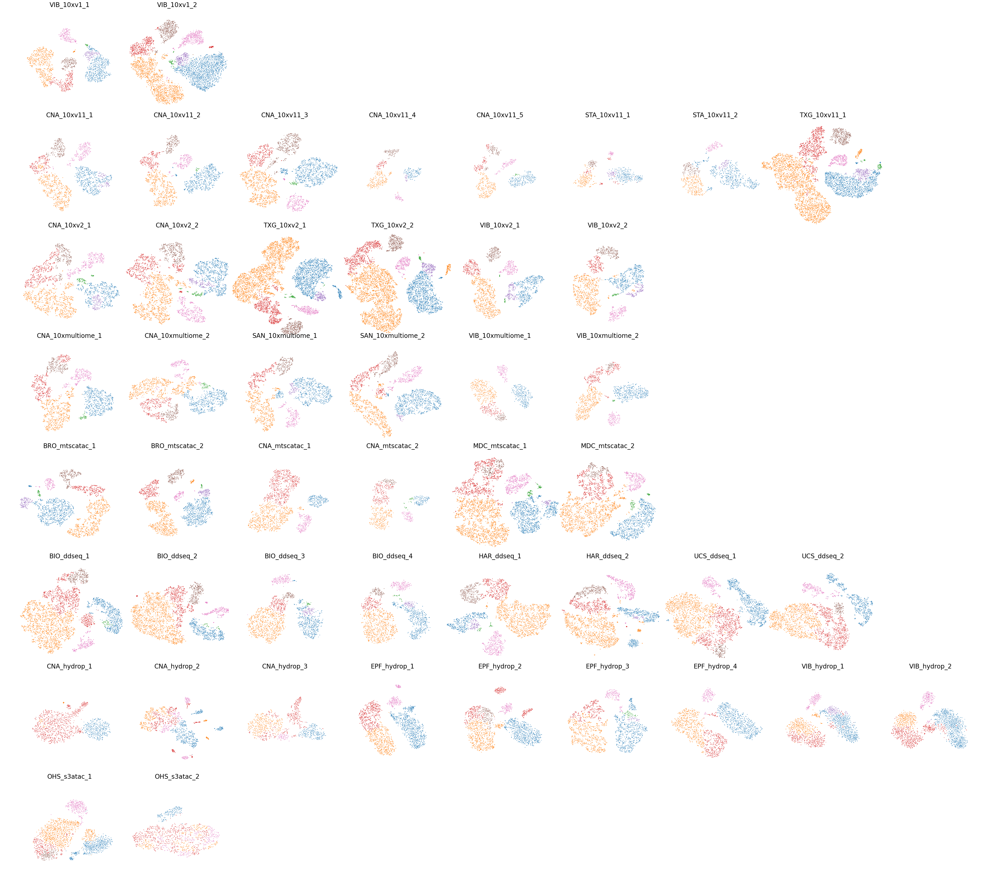

In [239]:
n_techs = len(order_bytech)
max_samples_in_tech = max([len(x) for x in order_bytech])

fig, axes = plt.subplots(n_techs, max_samples_in_tech, sharex=True, sharey=True)
fig.set_figheight(5 * n_techs)
fig.set_figwidth(5 * max_samples_in_tech)


for tech_set in order_bytech:
    tech = tech_set[0].split("_")[1]
    print(tech)

    tech_set_index = order_bytech.index(tech_set)

    for sample in tech_set:
        sample_index = tech_set.index(sample)
        supersample = sample.split(".")[0]

        ax = axes[tech_set_index, sample_index]

        with open(cto_path_dict[sample], "rb") as fh:
            cto = pickle.load(fh)

        ### Plot 1
        cto.cell_data["tSNE_1"] = cto.projections["cell"]["tSNE"]["tSNE_1"]
        cto.cell_data["tSNE_2"] = cto.projections["cell"]["tSNE"]["tSNE_2"]
        toplot_df = cto.cell_data

        sns.scatterplot(
            data=toplot_df,
            x="tSNE_1",
            y="tSNE_2",
            hue="consensus_cell_type",
            palette=cell_palette,
            ax=ax,
            s=2,
            linewidth=0,
            legend=False,
        )

        ax.set_title(
            label=supersample,
            fontdict={"fontsize": fontsize_large},
        )

        if sample_index == 0:
            ax.yaxis.set_label_position("left")
            ax.set_ylabel(
                tech_alias_dict[tech],
                rotation=90,
                fontsize=fontsize_large,
                # horizontalalignment="left",
                # verticalalignment="bottom",
            )
            # ax.yaxis.set_label_coords(1.05, 0.05)

        plt.tight_layout()
        plt.subplots_adjust(wspace=-0.2, hspace=0)

for ax_set in axes:
    for ax in ax_set:
        ax.set_axis_off()

plt.savefig("plts/tSNE_all.png", facecolor="white", dpi=300)
plt.show()
plt.close()

# by_centre_40k

['VIB_10xv1_1.FIXEDCELLS', 'VIB_10xv1_2.FIXEDCELLS'] done!
['CNA_10xv11_1.FIXEDCELLS', 'CNA_10xv11_2.FIXEDCELLS', 'CNA_10xv11_3.FIXEDCELLS', 'CNA_10xv11_4.FIXEDCELLS', 'CNA_10xv11_5.FIXEDCELLS'] done!
['STA_10xv11_1.FIXEDCELLS', 'STA_10xv11_2.FIXEDCELLS'] done!
['TXG_10xv11_1.FIXEDCELLS'] done!
['CNA_10xv2_1.FIXEDCELLS', 'CNA_10xv2_2.FIXEDCELLS'] done!
['TXG_10xv2_1.FIXEDCELLS', 'TXG_10xv2_2.FIXEDCELLS'] done!
['VIB_10xv2_1.FIXEDCELLS', 'VIB_10xv2_2.FIXEDCELLS'] done!
['CNA_10xmultiome_1.FIXEDCELLS', 'CNA_10xmultiome_2.FIXEDCELLS'] done!
['SAN_10xmultiome_1.FIXEDCELLS', 'SAN_10xmultiome_2.FIXEDCELLS'] done!
['VIB_10xmultiome_1.FIXEDCELLS', 'VIB_10xmultiome_2.FIXEDCELLS'] done!
['BRO_mtscatac_1.FIXEDCELLS', 'BRO_mtscatac_2.FIXEDCELLS'] done!
['CNA_mtscatac_1.FIXEDCELLS', 'CNA_mtscatac_2.FIXEDCELLS'] done!
['MDC_mtscatac_1.FIXEDCELLS', 'MDC_mtscatac_2.FIXEDCELLS'] done!
['BIO_ddseq_1.FIXEDCELLS', 'BIO_ddseq_2.FIXEDCELLS', 'BIO_ddseq_3.FIXEDCELLS', 'BIO_ddseq_4.FIXEDCELLS'] done!
['HAR_dd

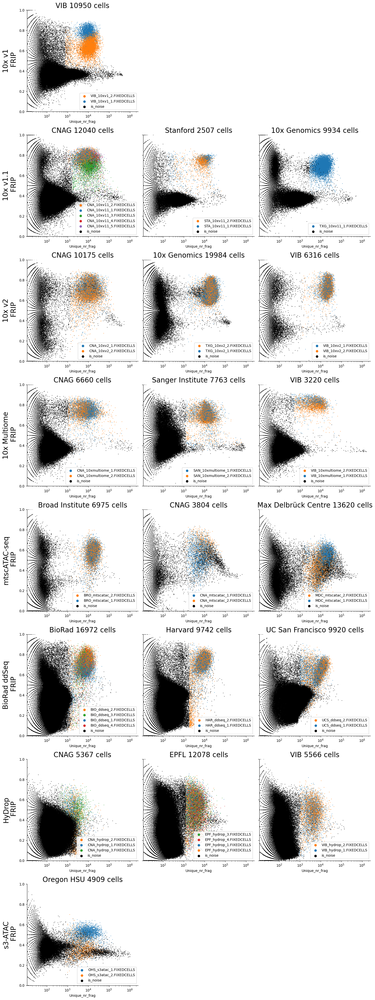

In [186]:
depth = "40k"
save_path = f"plts/{depth}_{y_stat}__{x_stat}__bytech.png"

draw_cutoffs = False
shuffle_dots = True

x_stat = "Unique_nr_frag"
y_stat = "TSS_enrichment"
z_stat = "is_cell"


n_techs = len(order_bytech_bycentre)
max_centres_in_tech = max([len(x) for x in order_bytech_bycentre])

fig, axes = plt.subplots(n_techs, max_centres_in_tech, sharex=False, sharey=True)
fig.set_figheight(5 * n_techs)
fig.set_figwidth(5 * max_centres_in_tech)

fontsize_large = 20

for y_stat in ["FRIP"]:
    for tech_set in order_bytech_bycentre:
        tech_set_index = order_bytech_bycentre.index(tech_set)
        tech = tech_set[0][0].split("_")[1]
        for centre_set in tech_set:
            centre_index = tech_set.index(centre_set)
            centre = centre_alias_dict[centre_set[0].split("_")[0]]
            ax = axes[tech_set_index, centre_index]

            metadata_bc_df_merged = pd.DataFrame()
            for sample in centre_set:
                supersample = sample.split(".")[0]

                with open(metadata_bc_pkl_path_dict[sample], "rb") as fh:
                    metadata_bc_df = pickle.load(fh)

                metadata_bc_df["supersample"] = [
                    x.split(".")[0] for x in metadata_bc_df["sample_id"]
                ]
                metadata_bc_df["raw_barcode"] = [
                    x.split("___")[0] for x in metadata_bc_df.index
                ]

                with open(selected_bc_path_dict[supersample], "rb") as fh:
                    bc_passing_filters = pickle.load(fh)

                bc_passing_filters_raw = [x.split("___")[0] for x in bc_passing_filters]

                metadata_bc_df["is_cell"] = (
                    metadata_bc_df["raw_barcode"]
                    .isin(bc_passing_filters_raw)
                    .replace(to_replace=True, value=sample)
                    .replace(to_replace=False, value="is_noise")
                )

                metadata_bc_df_merged = pd.concat(
                    [metadata_bc_df_merged, metadata_bc_df]
                )

            if shuffle_dots == True:
                df_cells = metadata_bc_df_merged[
                    metadata_bc_df_merged["is_cell"] != "is_noise"
                ].sample(frac=1)
                df_noise = metadata_bc_df_merged[
                    metadata_bc_df_merged["is_cell"] == "is_noise"
                ]
                metadata_bc_df_merged = pd.concat([df_cells, df_noise])

            ### Plot
            is_cell_color_palette_sample = {
                sample: list(sns.color_palette(n_colors=len(centre_set)))[
                    centre_set.index(sample)
                ]
                for sample in centre_set
            }
            is_cell_color_palette_sample["is_noise"] = (0, 0, 0)

            is_cell_color_palette = {
                "is_cell": is_cell_color_palette_sample[sample],
                "is_noise": (0, 0, 0),
            }

            sns.scatterplot(
                data=metadata_bc_df_merged,
                x=x_stat,
                y=y_stat,
                hue=z_stat,
                palette=is_cell_color_palette_sample,
                ax=ax,
                s=2,
                linewidth=0,
                legend="brief",
            )

            ax.set_xscale("log")
            ax.set_xlim(min_dict[x_stat], max_dict[x_stat])
            ax.set_ylim(min_dict[y_stat], max_dict[y_stat])
            ax.legend(loc="lower right")

            ax.set_title(
                label=centre + f" {len(df_cells)} cells",
                fontdict={"fontsize": fontsize_large},
            )

            if centre_index == 0:
                ax.yaxis.set_label_position("left")
                ax.set_ylabel(
                    tech_alias_dict[tech] + f"\n {y_stat}",
                    rotation=90,
                    fontsize=fontsize_large,
                    # horizontalalignment="left",
                    # verticalalignment="bottom",
                )
                # ax.yaxis.set_label_coords(1.05, 0.05)

            if draw_cutoffs == True:
                x_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                    x_stat
                ]
                y_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                    y_stat
                ]
                ax.axvline(x=x_cutoff, color="r", linestyle="--")
                ax.axhline(y=y_cutoff, color="r", linestyle="--")

            print(f"{centre_set} done!")

    for ax_set in axes:
        for ax in ax_set:
            if not ax.collections:
                ax.set_axis_off()

    sns.despine(fig=fig, top=True, right=True)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, facecolor="white")
    plt.show()
    plt.close()

['VIB_10xv1_1.FIXEDCELLS', 'VIB_10xv1_2.FIXEDCELLS'] done!
['CNA_10xv11_1.FIXEDCELLS', 'CNA_10xv11_2.FIXEDCELLS', 'CNA_10xv11_3.FIXEDCELLS', 'CNA_10xv11_4.FIXEDCELLS', 'CNA_10xv11_5.FIXEDCELLS'] done!
['STA_10xv11_1.FIXEDCELLS', 'STA_10xv11_2.FIXEDCELLS'] done!
['TXG_10xv11_1.FIXEDCELLS'] done!
['CNA_10xv2_1.FIXEDCELLS', 'CNA_10xv2_2.FIXEDCELLS'] done!
['TXG_10xv2_1.FIXEDCELLS', 'TXG_10xv2_2.FIXEDCELLS'] done!
['VIB_10xv2_1.FIXEDCELLS', 'VIB_10xv2_2.FIXEDCELLS'] done!
['CNA_10xmultiome_1.FIXEDCELLS', 'CNA_10xmultiome_2.FIXEDCELLS'] done!
['SAN_10xmultiome_1.FIXEDCELLS', 'SAN_10xmultiome_2.FIXEDCELLS'] done!
['VIB_10xmultiome_1.FIXEDCELLS', 'VIB_10xmultiome_2.FIXEDCELLS'] done!
['BRO_mtscatac_1.FIXEDCELLS', 'BRO_mtscatac_2.FIXEDCELLS'] done!
['CNA_mtscatac_1.FIXEDCELLS', 'CNA_mtscatac_2.FIXEDCELLS'] done!
['MDC_mtscatac_1.FIXEDCELLS', 'MDC_mtscatac_2.FIXEDCELLS'] done!
['BIO_ddseq_1.FIXEDCELLS', 'BIO_ddseq_2.FIXEDCELLS', 'BIO_ddseq_3.FIXEDCELLS', 'BIO_ddseq_4.FIXEDCELLS'] done!
['HAR_dd

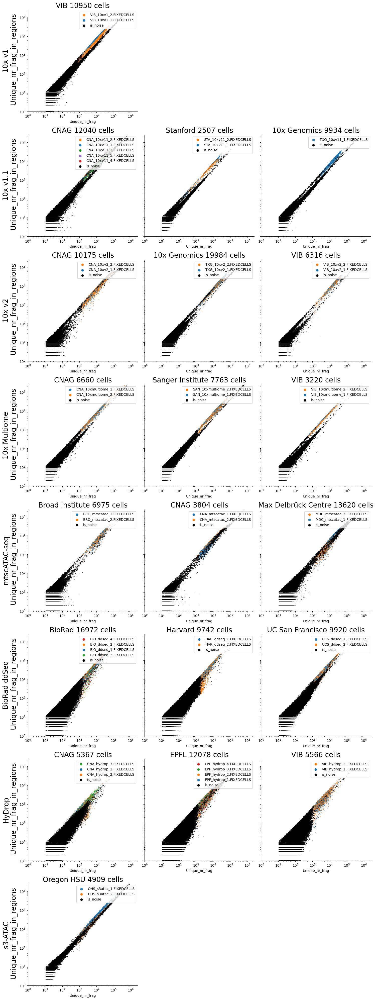

In [188]:
depth = "40k"
save_path = f"plts/{depth}_{y_stat}__{x_stat}__bytech.png"

draw_cutoffs = False
shuffle_dots = True

x_stat = "Unique_nr_frag"
y_stat = "Unique_nr_frag_in_regions"
z_stat = "is_cell"


n_techs = len(order_bytech_bycentre)
max_centres_in_tech = max([len(x) for x in order_bytech_bycentre])

fig, axes = plt.subplots(n_techs, max_centres_in_tech, sharex=False, sharey=True)
fig.set_figheight(5 * n_techs)
fig.set_figwidth(5 * max_centres_in_tech)

fontsize_large = 20

for tech_set in order_bytech_bycentre:
    tech_set_index = order_bytech_bycentre.index(tech_set)
    tech = tech_set[0][0].split("_")[1]
    for centre_set in tech_set:
        centre_index = tech_set.index(centre_set)
        centre = centre_alias_dict[centre_set[0].split("_")[0]]
        ax = axes[tech_set_index, centre_index]

        metadata_bc_df_merged = pd.DataFrame()
        for sample in centre_set:
            supersample = sample.split(".")[0]

            with open(metadata_bc_pkl_path_dict[sample], "rb") as fh:
                metadata_bc_df = pickle.load(fh)

            metadata_bc_df["supersample"] = [
                x.split(".")[0] for x in metadata_bc_df["sample_id"]
            ]
            metadata_bc_df["raw_barcode"] = [
                x.split("___")[0] for x in metadata_bc_df.index
            ]

            with open(selected_bc_path_dict[supersample], "rb") as fh:
                bc_passing_filters = pickle.load(fh)

            bc_passing_filters_raw = [x.split("___")[0] for x in bc_passing_filters]

            metadata_bc_df["is_cell"] = (
                metadata_bc_df["raw_barcode"]
                .isin(bc_passing_filters_raw)
                .replace(to_replace=True, value=sample)
                .replace(to_replace=False, value="is_noise")
            )

            metadata_bc_df_merged = pd.concat([metadata_bc_df_merged, metadata_bc_df])

        if shuffle_dots == True:
            df_cells = metadata_bc_df_merged[
                metadata_bc_df_merged["is_cell"] != "is_noise"
            ].sample(frac=1)
            df_noise = metadata_bc_df_merged[
                metadata_bc_df_merged["is_cell"] == "is_noise"
            ]
            metadata_bc_df_merged = pd.concat([df_cells, df_noise])

        ### Plot
        is_cell_color_palette_sample = {
            sample: list(sns.color_palette(n_colors=len(centre_set)))[
                centre_set.index(sample)
            ]
            for sample in centre_set
        }
        is_cell_color_palette_sample["is_noise"] = (0, 0, 0)

        is_cell_color_palette = {
            "is_cell": is_cell_color_palette_sample[sample],
            "is_noise": (0, 0, 0),
        }

        sns.scatterplot(
            data=metadata_bc_df_merged,
            x=x_stat,
            y=y_stat,
            hue=z_stat,
            palette=is_cell_color_palette_sample,
            ax=ax,
            s=2,
            linewidth=0,
            legend="brief",
        )

        ax.set_xscale("log")
        ax.set_yscale("log")

        ax.set_xlim(1, max_dict[x_stat])
        ax.set_ylim(1, max_dict[y_stat])
        ax.legend(loc="upper right")

        ax.set_title(
            label=centre + f" {len(df_cells)} cells",
            fontdict={"fontsize": fontsize_large},
        )

        if centre_index == 0:
            ax.yaxis.set_label_position("left")
            ax.set_ylabel(
                tech_alias_dict[tech] + f"\n {y_stat}",
                rotation=90,
                fontsize=fontsize_large,
                # horizontalalignment="left",
                # verticalalignment="bottom",
            )
            # ax.yaxis.set_label_coords(1.05, 0.05)

        if draw_cutoffs == True:
            x_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                x_stat
            ]
            y_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                y_stat
            ]
            ax.axvline(x=x_cutoff, color="r", linestyle="--")
            ax.axhline(y=y_cutoff, color="r", linestyle="--")

        print(f"{centre_set} done!")

for ax_set in axes:
    for ax in ax_set:
        if not ax.collections:
            ax.set_axis_off()

sns.despine(fig=fig, top=True, right=True)

plt.tight_layout()
plt.savefig(save_path, dpi=300, facecolor="white")
plt.show()
plt.close()

['VIB_10xv1_1.FIXEDCELLS', 'VIB_10xv1_2.FIXEDCELLS'] done!
['CNA_10xv11_1.FIXEDCELLS', 'CNA_10xv11_2.FIXEDCELLS', 'CNA_10xv11_3.FIXEDCELLS', 'CNA_10xv11_4.FIXEDCELLS', 'CNA_10xv11_5.FIXEDCELLS'] done!
['STA_10xv11_1.FIXEDCELLS', 'STA_10xv11_2.FIXEDCELLS'] done!
['TXG_10xv11_1.FIXEDCELLS'] done!
['CNA_10xv2_1.FIXEDCELLS', 'CNA_10xv2_2.FIXEDCELLS'] done!
['TXG_10xv2_1.FIXEDCELLS', 'TXG_10xv2_2.FIXEDCELLS'] done!
['VIB_10xv2_1.FIXEDCELLS', 'VIB_10xv2_2.FIXEDCELLS'] done!
['CNA_10xmultiome_1.FIXEDCELLS', 'CNA_10xmultiome_2.FIXEDCELLS'] done!
['SAN_10xmultiome_1.FIXEDCELLS', 'SAN_10xmultiome_2.FIXEDCELLS'] done!
['VIB_10xmultiome_1.FIXEDCELLS', 'VIB_10xmultiome_2.FIXEDCELLS'] done!
['BRO_mtscatac_1.FIXEDCELLS', 'BRO_mtscatac_2.FIXEDCELLS'] done!
['CNA_mtscatac_1.FIXEDCELLS', 'CNA_mtscatac_2.FIXEDCELLS'] done!
['MDC_mtscatac_1.FIXEDCELLS', 'MDC_mtscatac_2.FIXEDCELLS'] done!
['BIO_ddseq_1.FIXEDCELLS', 'BIO_ddseq_2.FIXEDCELLS', 'BIO_ddseq_3.FIXEDCELLS', 'BIO_ddseq_4.FIXEDCELLS'] done!
['HAR_dd

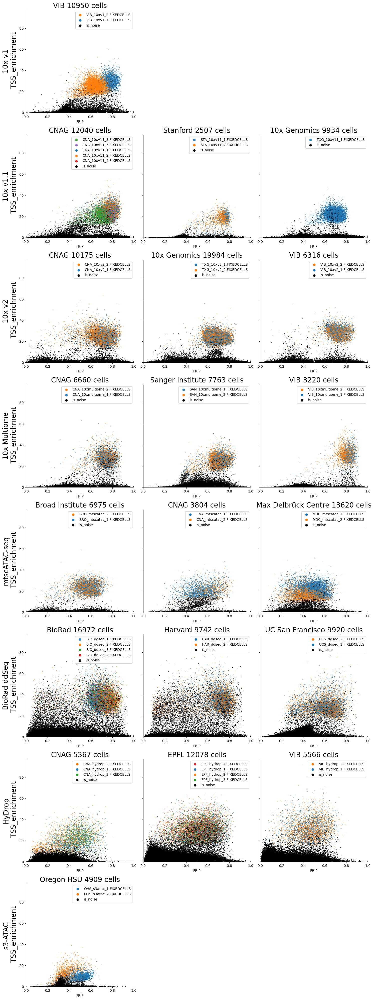

In [185]:
depth = "40k"
save_path = f"plts/{depth}_{y_stat}__{x_stat}__bytech.png"

draw_cutoffs = False
shuffle_dots = True

x_stat = "FRIP"
y_stat = "TSS_enrichment"
z_stat = "is_cell"


n_techs = len(order_bytech_bycentre)
max_centres_in_tech = max([len(x) for x in order_bytech_bycentre])

fig, axes = plt.subplots(n_techs, max_centres_in_tech, sharex=False, sharey=True)
fig.set_figheight(5 * n_techs)
fig.set_figwidth(5 * max_centres_in_tech)

fontsize_large = 20

for tech_set in order_bytech_bycentre:
    tech_set_index = order_bytech_bycentre.index(tech_set)
    tech = tech_set[0][0].split("_")[1]
    for centre_set in tech_set:
        centre_index = tech_set.index(centre_set)
        centre = centre_alias_dict[centre_set[0].split("_")[0]]
        ax = axes[tech_set_index, centre_index]

        metadata_bc_df_merged = pd.DataFrame()
        for sample in centre_set:
            supersample = sample.split(".")[0]

            with open(metadata_bc_pkl_path_dict[sample], "rb") as fh:
                metadata_bc_df = pickle.load(fh)

            metadata_bc_df["supersample"] = [
                x.split(".")[0] for x in metadata_bc_df["sample_id"]
            ]
            metadata_bc_df["raw_barcode"] = [
                x.split("___")[0] for x in metadata_bc_df.index
            ]

            with open(selected_bc_path_dict[supersample], "rb") as fh:
                bc_passing_filters = pickle.load(fh)

            bc_passing_filters_raw = [x.split("___")[0] for x in bc_passing_filters]

            metadata_bc_df["is_cell"] = (
                metadata_bc_df["raw_barcode"]
                .isin(bc_passing_filters_raw)
                .replace(to_replace=True, value=sample)
                .replace(to_replace=False, value="is_noise")
            )

            metadata_bc_df_merged = pd.concat([metadata_bc_df_merged, metadata_bc_df])

        if shuffle_dots == True:
            df_cells = metadata_bc_df_merged[
                metadata_bc_df_merged["is_cell"] != "is_noise"
            ].sample(frac=1)
            df_noise = metadata_bc_df_merged[
                metadata_bc_df_merged["is_cell"] == "is_noise"
            ]
            metadata_bc_df_merged = pd.concat([df_cells, df_noise])

        ### Plot
        is_cell_color_palette_sample = {
            sample: list(sns.color_palette(n_colors=len(centre_set)))[
                centre_set.index(sample)
            ]
            for sample in centre_set
        }
        is_cell_color_palette_sample["is_noise"] = (0, 0, 0)

        is_cell_color_palette = {
            "is_cell": is_cell_color_palette_sample[sample],
            "is_noise": (0, 0, 0),
        }

        sns.scatterplot(
            data=metadata_bc_df_merged,
            x=x_stat,
            y=y_stat,
            hue=z_stat,
            palette=is_cell_color_palette_sample,
            ax=ax,
            s=2,
            linewidth=0,
            legend="brief",
        )

        # ax.set_xscale("log")
        ax.set_xlim(min_dict[x_stat], max_dict[x_stat])
        ax.set_ylim(min_dict[y_stat], max_dict[y_stat])
        ax.legend(loc="upper right")

        ax.set_title(
            label=centre + f" {len(df_cells)} cells",
            fontdict={"fontsize": fontsize_large},
        )

        if centre_index == 0:
            ax.yaxis.set_label_position("left")
            ax.set_ylabel(
                tech_alias_dict[tech] + f"\n {y_stat}",
                rotation=90,
                fontsize=fontsize_large,
                # horizontalalignment="left",
                # verticalalignment="bottom",
            )
            # ax.yaxis.set_label_coords(1.05, 0.05)

        if draw_cutoffs == True:
            x_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                x_stat
            ]
            y_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                y_stat
            ]
            ax.axvline(x=x_cutoff, color="r", linestyle="--")
            ax.axhline(y=y_cutoff, color="r", linestyle="--")

        print(f"{centre_set} done!")

for ax_set in axes:
    for ax in ax_set:
        if not ax.collections:
            ax.set_axis_off()

sns.despine(fig=fig, top=True, right=True)

plt.tight_layout()
plt.savefig(save_path, dpi=300, facecolor="white")
plt.show()
plt.close()

# FULL data

In [130]:
order_bytech_bycentre = [
    [["VIB_10xv1_1.FULL", "VIB_10xv1_2.FULL"]],
    [
        [
            "CNA_10xv11_1.FULL",
            "CNA_10xv11_2.FULL",
            "CNA_10xv11_3.FULL",
            "CNA_10xv11_4.FULL",
            "CNA_10xv11_5.FULL",
        ],
        [
            "STA_10xv11_1.FULL",
            "STA_10xv11_2.FULL",
        ],
        [
            "TXG_10xv11_1.FULL",
        ],
    ],
    [
        [
            "CNA_10xv2_1.FULL",
            "CNA_10xv2_2.FULL",
        ],
        [
            "TXG_10xv2_1.FULL",
            "TXG_10xv2_2.FULL",
        ],
        [
            "VIB_10xv2_1.FULL",
            "VIB_10xv2_2.FULL",
        ],
    ],
    [
        [
            "CNA_10xmultiome_1.FULL",
            "CNA_10xmultiome_2.FULL",
        ],
        [
            "SAN_10xmultiome_1.FULL",
            "SAN_10xmultiome_2.FULL",
        ],
        [
            "VIB_10xmultiome_1.FULL",
            "VIB_10xmultiome_2.FULL",
        ],
    ],
    [
        [
            "BRO_mtscatac_1.FULL",
            "BRO_mtscatac_2.FULL",
        ],
        [
            "CNA_mtscatac_1.FULL",
            "CNA_mtscatac_2.FULL",
        ],
        [
            "MDC_mtscatac_1.FULL",
            "MDC_mtscatac_2.FULL",
        ],
    ],
    [
        [
            "BIO_ddseq_1.FULL",
            "BIO_ddseq_2.FULL",
            "BIO_ddseq_3.FULL",
            "BIO_ddseq_4.FULL",
        ],
        [
            "HAR_ddseq_1.FULL",
            "HAR_ddseq_2.FULL",
        ],
        [
            "UCS_ddseq_1.FULL",
            "UCS_ddseq_2.FULL",
        ],
    ],
    [
        [
            "CNA_hydrop_1.FULL",
            "CNA_hydrop_2.FULL",
            "CNA_hydrop_3.FULL",
        ],
        [
            "EPF_hydrop_1.FULL",
            "EPF_hydrop_2.FULL",
            "EPF_hydrop_3.FULL",
            "EPF_hydrop_4.FULL",
        ],
        [
            "VIB_hydrop_1.FULL",
            "VIB_hydrop_2.FULL",
        ],
    ],
    [["OHS_s3atac_1.FULL", "OHS_s3atac_2.FULL"]],
]

In [131]:
metadata_bc_pkl_path_dict = {
    x.split("/")[-1].split("__")[0]: x
    for x in sorted(glob.glob("full/cistopic_qc_out_CONSENSUS/*metadata_bc.pkl"))
}
for key in [
    "VIB_hydrop_11.FULL",
    "VIB_hydrop_12.FULL",
    "VIB_hydrop_21.FULL",
    "VIB_hydrop_22.FULL",
]:
    metadata_bc_pkl_path_dict.pop(key)

metadata_bc_pkl_path_dict

{'BIO_ddseq_1.FULL': 'full/cistopic_qc_out_CONSENSUS/BIO_ddseq_1.FULL__metadata_bc.pkl',
 'BIO_ddseq_2.FULL': 'full/cistopic_qc_out_CONSENSUS/BIO_ddseq_2.FULL__metadata_bc.pkl',
 'BIO_ddseq_3.FULL': 'full/cistopic_qc_out_CONSENSUS/BIO_ddseq_3.FULL__metadata_bc.pkl',
 'BIO_ddseq_4.FULL': 'full/cistopic_qc_out_CONSENSUS/BIO_ddseq_4.FULL__metadata_bc.pkl',
 'BRO_mtscatac_1.FULL': 'full/cistopic_qc_out_CONSENSUS/BRO_mtscatac_1.FULL__metadata_bc.pkl',
 'BRO_mtscatac_2.FULL': 'full/cistopic_qc_out_CONSENSUS/BRO_mtscatac_2.FULL__metadata_bc.pkl',
 'CNA_10xmultiome_1.FULL': 'full/cistopic_qc_out_CONSENSUS/CNA_10xmultiome_1.FULL__metadata_bc.pkl',
 'CNA_10xmultiome_2.FULL': 'full/cistopic_qc_out_CONSENSUS/CNA_10xmultiome_2.FULL__metadata_bc.pkl',
 'CNA_10xv11_1.FULL': 'full/cistopic_qc_out_CONSENSUS/CNA_10xv11_1.FULL__metadata_bc.pkl',
 'CNA_10xv11_2.FULL': 'full/cistopic_qc_out_CONSENSUS/CNA_10xv11_2.FULL__metadata_bc.pkl',
 'CNA_10xv11_3.FULL': 'full/cistopic_qc_out_CONSENSUS/CNA_10xv11_3.FUL

['VIB_10xv1_1.FULL', 'VIB_10xv1_2.FULL'] done!
['CNA_10xv11_1.FULL', 'CNA_10xv11_2.FULL', 'CNA_10xv11_3.FULL', 'CNA_10xv11_4.FULL', 'CNA_10xv11_5.FULL'] done!
['STA_10xv11_1.FULL', 'STA_10xv11_2.FULL'] done!
['TXG_10xv11_1.FULL'] done!
['CNA_10xv2_1.FULL', 'CNA_10xv2_2.FULL'] done!
['TXG_10xv2_1.FULL', 'TXG_10xv2_2.FULL'] done!
['VIB_10xv2_1.FULL', 'VIB_10xv2_2.FULL'] done!
['CNA_10xmultiome_1.FULL', 'CNA_10xmultiome_2.FULL'] done!
['SAN_10xmultiome_1.FULL', 'SAN_10xmultiome_2.FULL'] done!
['VIB_10xmultiome_1.FULL', 'VIB_10xmultiome_2.FULL'] done!
['BRO_mtscatac_1.FULL', 'BRO_mtscatac_2.FULL'] done!
['CNA_mtscatac_1.FULL', 'CNA_mtscatac_2.FULL'] done!
['MDC_mtscatac_1.FULL', 'MDC_mtscatac_2.FULL'] done!
['BIO_ddseq_1.FULL', 'BIO_ddseq_2.FULL', 'BIO_ddseq_3.FULL', 'BIO_ddseq_4.FULL'] done!
['HAR_ddseq_1.FULL', 'HAR_ddseq_2.FULL'] done!
['UCS_ddseq_1.FULL', 'UCS_ddseq_2.FULL'] done!
['CNA_hydrop_1.FULL', 'CNA_hydrop_2.FULL', 'CNA_hydrop_3.FULL'] done!
['EPF_hydrop_1.FULL', 'EPF_hydrop_2.

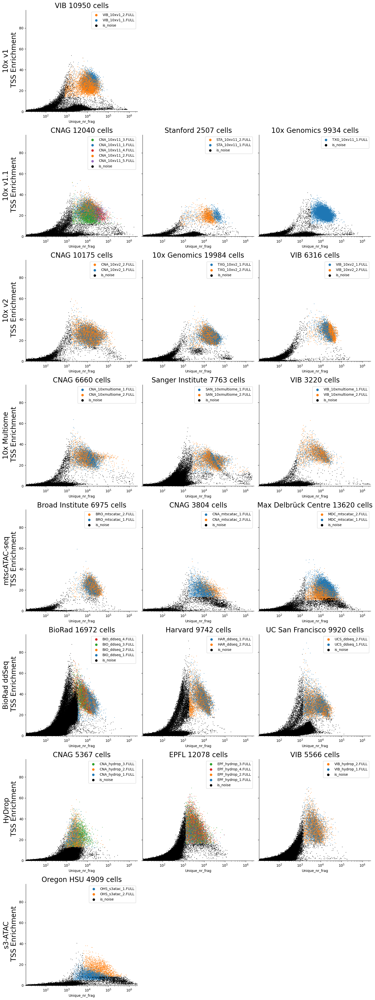

In [146]:
depth = "FULL"
save_path = f"plts/{depth}_{y_stat}__{x_stat}__bytech.png"

draw_cutoffs = False
shuffle_dots = True

x_stat = "Unique_nr_frag"
y_stat = "TSS_enrichment"
z_stat = "is_cell"


n_techs = len(order_bytech_bycentre)
max_centres_in_tech = max([len(x) for x in order_bytech_bycentre])

fig, axes = plt.subplots(n_techs, max_centres_in_tech, sharex=False, sharey=True)
fig.set_figheight(5 * n_techs)
fig.set_figwidth(5 * max_centres_in_tech)

fontsize_large = 20


for tech_set in order_bytech_bycentre:
    tech_set_index = order_bytech_bycentre.index(tech_set)
    tech = tech_set[0][0].split("_")[1]
    for centre_set in tech_set:
        centre_index = tech_set.index(centre_set)
        centre = centre_alias_dict[centre_set[0].split("_")[0]]
        ax = axes[tech_set_index, centre_index]

        metadata_bc_df_merged = pd.DataFrame()
        for sample in centre_set:
            supersample = sample.split(".")[0]

            with open(metadata_bc_pkl_path_dict[sample], "rb") as fh:
                metadata_bc_df = pickle.load(fh)

            metadata_bc_df["supersample"] = [
                x.split(".")[0] for x in metadata_bc_df["sample_id"]
            ]
            metadata_bc_df["raw_barcode"] = [
                x.split("___")[0] for x in metadata_bc_df.index
            ]

            with open(selected_bc_path_dict[supersample], "rb") as fh:
                bc_passing_filters = pickle.load(fh)

            bc_passing_filters_raw = [x.split("___")[0] for x in bc_passing_filters]

            metadata_bc_df["is_cell"] = (
                metadata_bc_df["raw_barcode"]
                .isin(bc_passing_filters_raw)
                .replace(to_replace=True, value=sample)
                .replace(to_replace=False, value="is_noise")
            )

            metadata_bc_df_merged = pd.concat([metadata_bc_df_merged, metadata_bc_df])

        if shuffle_dots == True:
            df_cells = metadata_bc_df_merged[
                metadata_bc_df_merged["is_cell"] != "is_noise"
            ].sample(frac=1)
            df_noise = metadata_bc_df_merged[
                metadata_bc_df_merged["is_cell"] == "is_noise"
            ]
            metadata_bc_df_merged = pd.concat([df_cells, df_noise])

        ### Plot
        is_cell_color_palette_sample = {
            sample: list(sns.color_palette(n_colors=len(centre_set)))[
                centre_set.index(sample)
            ]
            for sample in centre_set
        }
        is_cell_color_palette_sample["is_noise"] = (0, 0, 0)

        is_cell_color_palette = {
            "is_cell": is_cell_color_palette_sample[sample],
            "is_noise": (0, 0, 0),
        }

        sns.scatterplot(
            data=metadata_bc_df_merged,
            x=x_stat,
            y=y_stat,
            hue=z_stat,
            palette=is_cell_color_palette_sample,
            ax=ax,
            s=2,
            linewidth=0,
            legend="brief",
        )

        ax.set_xscale("log")
        ax.set_xlim(min_dict[x_stat], max_dict[x_stat])
        ax.set_ylim(min_dict[y_stat], max_dict[y_stat])
        ax.legend(loc="upper right")

        ax.set_title(
            label=centre + f" {len(df_cells)} cells",
            fontdict={"fontsize": fontsize_large},
        )

        if centre_index == 0:
            ax.yaxis.set_label_position("left")
            ax.set_ylabel(
                tech_alias_dict[tech] + "\n TSS Enrichment",
                rotation=90,
                fontsize=fontsize_large,
                # horizontalalignment="left",
                # verticalalignment="bottom",
            )
            # ax.yaxis.set_label_coords(1.05, 0.05)

        if draw_cutoffs == True:
            x_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                x_stat
            ]
            y_cutoff = metadata_bc_df[metadata_bc_df["is_cell"] == "is_cell"].min()[
                y_stat
            ]
            ax.axvline(x=x_cutoff, color="r", linestyle="--")
            ax.axhline(y=y_cutoff, color="r", linestyle="--")

        print(f"{centre_set} done!")

for ax_set in axes:
    for ax in ax_set:
        if not ax.collections:
            ax.set_axis_off()

sns.despine(fig=fig, top=True, right=True)

plt.tight_layout()
plt.savefig(save_path, dpi=300, facecolor="white")
plt.show()
plt.close()